In [2]:
%pylab inline


from jax.config import config
config.update("jax_enable_x64", True)

import jax
import jax.numpy as jnp
import jax_cosmo as jc

import numpyro
from numpyro.handlers import seed, trace, condition
import numpyro.distributions as dist

import tensorflow_probability as tfp; tfp = tfp.substrates.jax
tfd= tfp.distributions

import logging
logger = logging.getLogger()
class CheckTypesFilter(logging.Filter):
    def filter(self, record):
        return "check_types" not in record.getMessage()
logger.addFilter(CheckTypesFilter())
from jax.scipy.ndimage import map_coordinates
import h5py
'unset XLA_FLAGS'

from sbi_lens.simulator.redshift import subdivide
import cmasher as cmr

Populating the interactive namespace from numpy and matplotlib


/gpfslocalsup/pub/anaconda-py3/2021.05/envs/tensorflow-2.7.0+py3.9/lib/python3.9/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['seed', 'trace']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


/linkhome/rech/genmfd01/ulm75uc/.local/lib/python3.9/site-packages/scipy/integrate/_quadrature.py:870: AccuracyWarning: divmax (10) exceeded. Latest difference = 5.553531e-07
  warnings.warn(
/linkhome/rech/genmfd01/ulm75uc/.local/lib/python3.9/site-packages/scipy/integrate/_quadrature.py:870: AccuracyWarning: divmax (10) exceeded. Latest difference = 5.884642e-08
  warnings.warn(


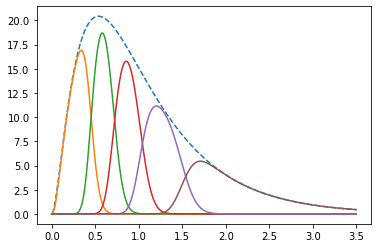

In [3]:
# Redshift distribution for sources as defined in https://arxiv.org/abs/2111.04917
nz = jc.redshift.smail_nz(2, 0.68, 0.11, gals_per_arcmin2=27)
nbins=5
nz_bins = subdivide(nz, nbins)
z = jnp.linspace(0,3.5,256)

plot(z, nz(z)*nz.gals_per_arcmin2, '--')
for b in nz_bins:
  plot(z, b(z)*b.gals_per_arcmin2)

In [4]:
lognormal_array=[]
for i in range(5):
      lognormal_array.append(np.loadtxt('/gpfs7kw/linkhome/rech/genmfd01/ulm75uc/CosMomentum/results_%i.txt' %i, delimiter=',').reshape([8,8,3]))
lognormal_array=np.stack(lognormal_array)                          

In [5]:
# Here we add the code that interpolates the shift parameters as a function of cosmology
@jax.jit
def shift_fn(omega_m, sigma_8):
  omega_m = jnp.atleast_1d(omega_m)
  sigma_8 = jnp.atleast_1d(sigma_8) 
  shift=[map_coordinates(lognormal_array[i,:,:,2], jnp.stack([(omega_m - 0.2) / 0.2*8 - 0.5,
                                                             (sigma_8 - 0.6) / 0.4*8 - 0.5], 
                                                            axis=0).reshape([2,-1]) , order=1, mode='nearest').squeeze() for i in range (5)]
  return jnp.stack(shift)

In [6]:

def fill_shift_array(shifts):
  idx=jnp.mask_indices(len(shifts), jnp.triu)
  shift_array =jnp.outer(shifts,shifts) [idx]
  return shift_array


In [7]:
def make_power_map(pk_fn, N, map_size, zero_freq_val=0.0, model_type=None ):
    k = 2 * jnp.pi * jnp.fft.fftfreq(N, d=map_size / N)
    kcoords = jnp.meshgrid(k, k)
    k = jnp.sqrt(kcoords[0]**2 + kcoords[1]**2)
    ps_map = pk_fn(k)
    ps_map = ps_map.at[0, 0].set(zero_freq_val)
    power_map = ps_map * (N / map_size)**2
    return power_map

def make_lognormal_power_map(power_map, shift, zero_freq_val=0.0):
    power_spectrum_for_lognorm = jnp.fft.ifft2(power_map).real
    power_spectrum_for_lognorm = jnp.log(1 +
                                         power_spectrum_for_lognorm / shift)
    power_spectrum_for_lognorm = jnp.abs(
        jnp.fft.fft2(power_spectrum_for_lognorm))
    return power_spectrum_for_lognorm


In [8]:
#some useful functions to make the plot

def fill_lower_and_diag(array,nl):
    n = int(np.sqrt(len(array)*2))
    mask = np.arange(n)[:,None] >= np.arange(n)
    out = np.zeros((n,n,nl),dtype=float64)
    out[np.stack(mask,axis=1)] = array
    return out.T


def fill_lower_diag(array,nl):
    n = int(np.sqrt(len(array)*2))+1
    mask = np.arange(n)[:,None] > np.arange(n)
    out = np.zeros((n,n, nl),dtype=float64)
    out[np.stack(mask,axis=1)] = array
    return out.T

In [9]:
nbins=5

In [13]:

def model(N=256,              
          map_size=10,      
          gal_per_arcmin2=27,   
          sigma_e=0.26,
          model_type='lognormal'):   
    pix_area = (map_size * 60 / N)**2 # arcmin2 
    map_size = map_size / 180 * jnp.pi    # radians
    omega_c = numpyro.sample('omega_c', dist.Normal(0.3, 0.05))
    sigma_8 = numpyro.sample('sigma_8', dist.Normal(0.8, 0.05))
    cosmo = jc.Planck15(Omega_c=omega_c, sigma8=sigma_8)
    ell_tab = 2 * jnp.pi * abs(jnp.fft.fftfreq(2*N, d=map_size / (2*N)))
    nz = jc.redshift.smail_nz(2,  0.68,  0.11, gals_per_arcmin2=gal_per_arcmin2)
    nbins=5
    nz_bins = subdivide(nz, nbins=nbins)
    tracer = jc.probes.WeakLensing(nz_bins, sigma_e=sigma_e)
    shift = shift_fn(cosmo.Omega_m, sigma_8)
    shift_array=fill_shift_array(shift)
    cell_tab = jc.angular_cl.angular_cl(cosmo, ell_tab, [tracer]) 
    power=[]
    for cl, l_shift in zip(cell_tab,shift_array):
      P = lambda k: jc.scipy.interpolate.interp(k.flatten(), ell_tab, cl).reshape(k.shape)
      power_map = make_power_map(P, N, map_size) 
      if model_type == 'lognormal':
          power_map = make_lognormal_power_map(power_map, l_shift)
      power.append(power_map)
    power = jnp.stack(power,axis=-1)

    @jax.vmap
    def fill_cov_mat(m):
      idx = np.triu_indices(nbins)
      cov_mat = jnp.zeros((nbins,nbins)).at[idx].set(m).T.at[idx].set(m)
      return cov_mat

    cov_mat = fill_cov_mat(power.reshape(-1, len(cell_tab))) # [128x128, 10] -> [128x128, 4, 4] 
    # Projection to PSD matrix and square root matrix
    l, A = jnp.linalg.eigh(cov_mat)
    L = jax.vmap(lambda M,v: M.dot(jnp.diag(jnp.sqrt(jnp.clip(v, a_min=0))).dot(M.T)))(A,l)
    L = L.reshape([N,N,nbins, nbins]) # [128, 128, 4, 4]
    # Set zero freq to zero for everybody
    L = L.at[0,0].set(jnp.zeros((nbins, nbins))) 
    L = L.transpose([2, 3, 0, 1]) # [4, 4, 128, 128]

    
    z=numpyro.sample('z', dist.MultivariateNormal(loc=jnp.zeros((nbins,N,N)), precision_matrix=jnp.eye(N)))
    
    field=(jnp.fft.fft2(z) * L)
    field=(jnp.fft.ifft2(jnp.sum(field, axis=1)).real)
    if model_type == 'lognormal':
         field= jnp.einsum('i, ijk -> ijk', shift, jnp.exp(field - jnp.var(field,axis=(1,2), keepdims=True) / 2) - 1)
    return field



In [14]:
fiducial_model = condition(model, {'omega_c': 0.3, 'sigma_8': 0.8})
sample_map_fiducial = seed(model, jax.random.PRNGKey(42))
m_data= sample_map_fiducial()

In [11]:
theta_max=10
EXTENT = (-0.5 * theta_max, 0.5 * theta_max, -0.5 * theta_max, 0.5 * theta_max)
cmap = cmr.eclipse

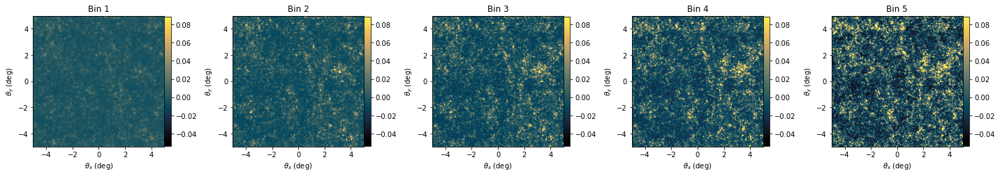

In [12]:

fig, ax = plt.subplots(1,nbins, figsize=(4 * nbins, 7))
for i in range(nbins):
    std_kmap = np.std(m_data[-1])
    ax[i].set_title('Bin %d'%(i+1))
    ax[i].set_xlabel(r'$\theta_x$ (deg)')
    ax[i].set_ylabel(r'$\theta_y$ (deg)')
    ax[i].imshow(m_data[i], cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT)
    cb = fig.colorbar(ax[i].imshow(m_data[i], cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT) ,fraction=0.047, pad=0.)
    cb.ax.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

### Create N mock realization to average over the final angular power spectrum

Sample 1


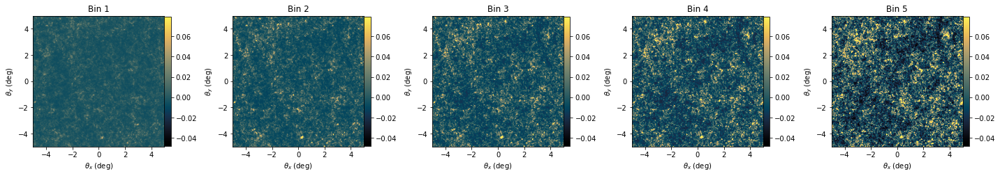

Sample 2


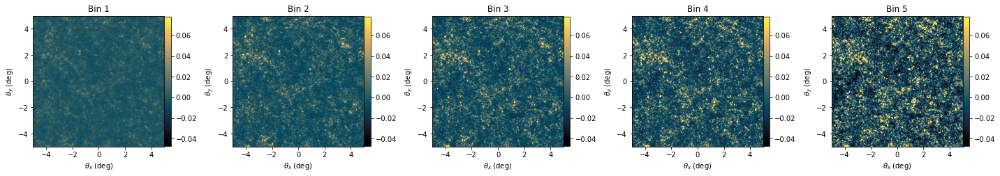

Sample 3


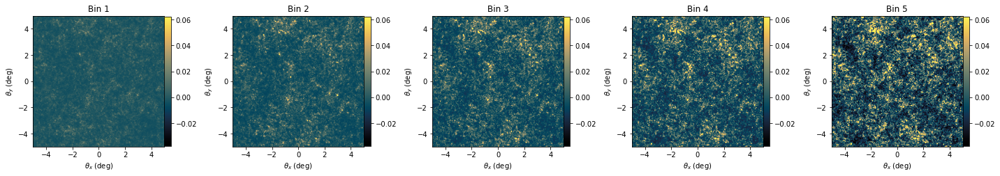

Sample 4


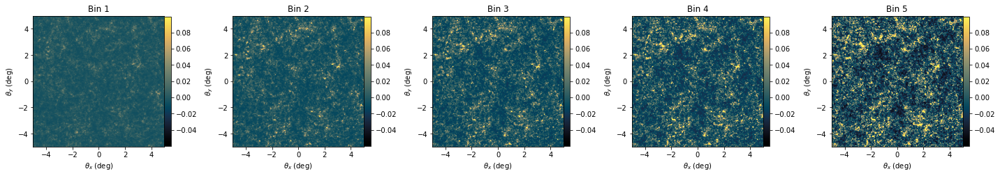

Sample 5


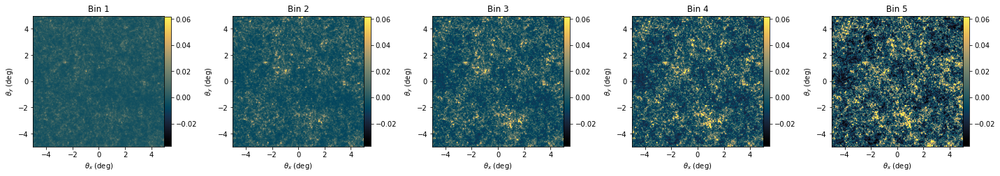

Sample 6


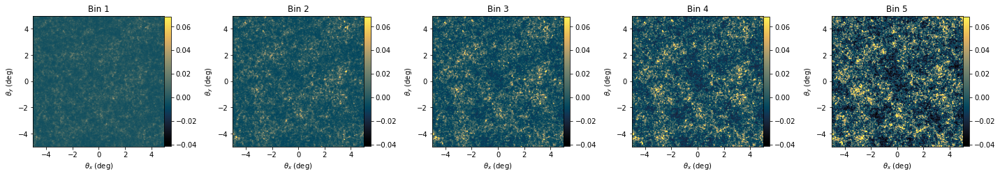

Sample 7


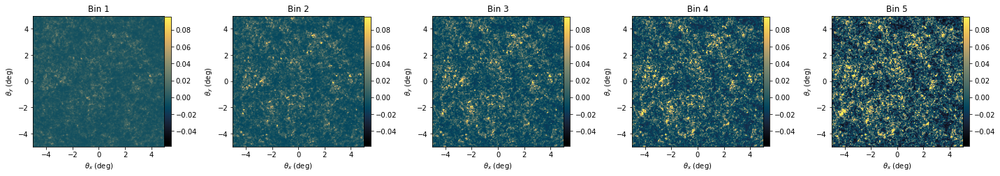

Sample 8


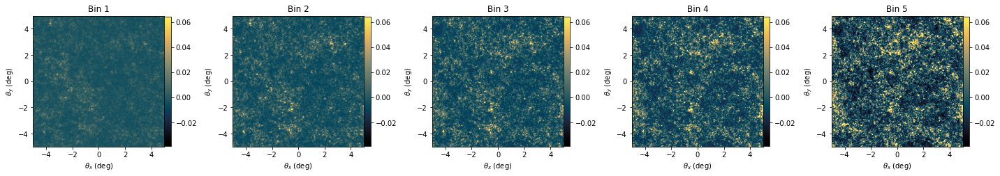

Sample 9


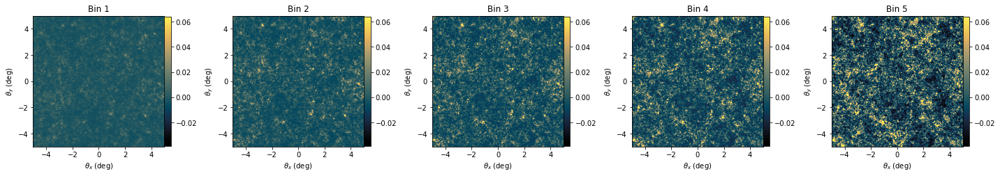

Sample 10


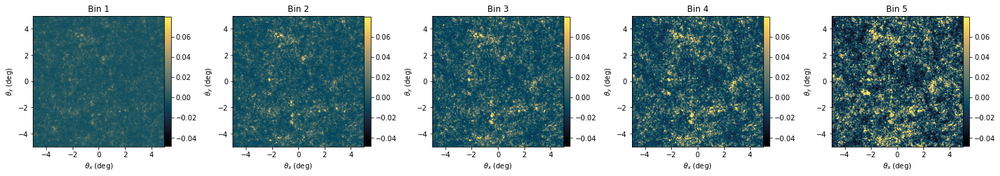

Sample 11


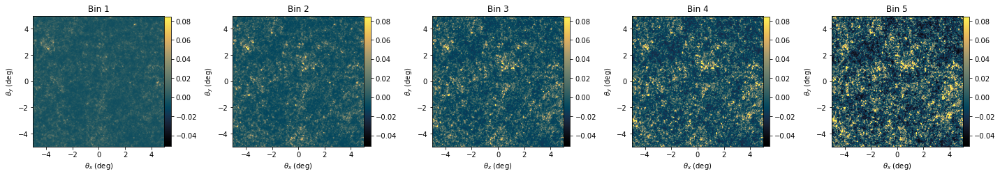

Sample 12


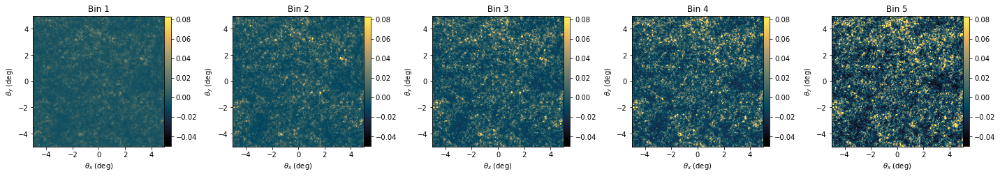

Sample 13


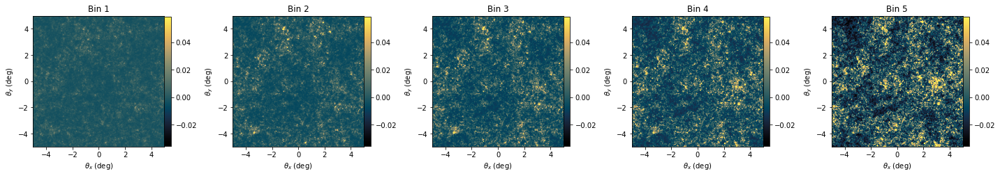

Sample 14


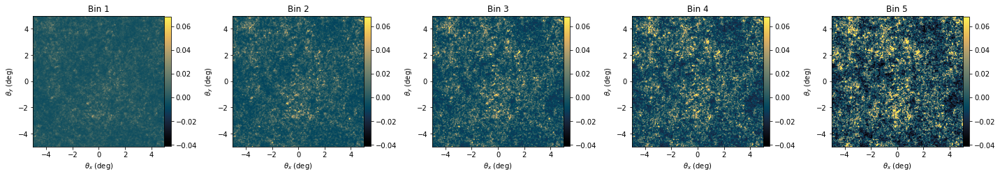

Sample 15


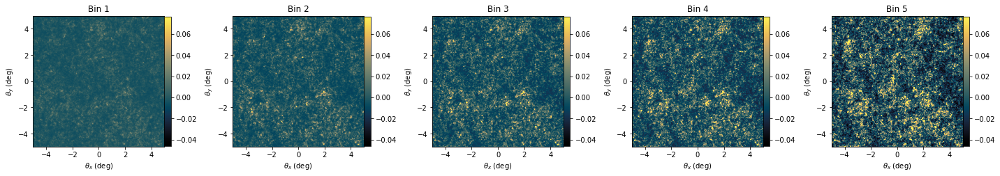

Sample 16


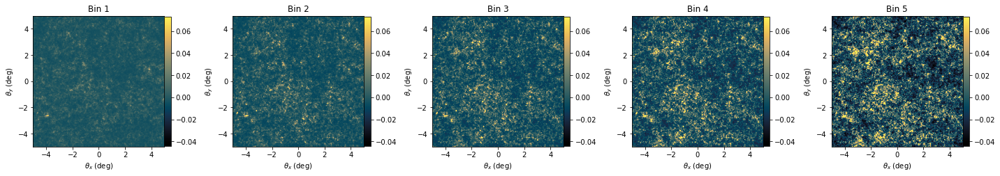

Sample 17


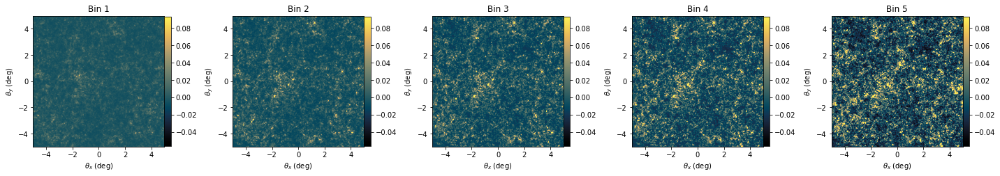

Sample 18


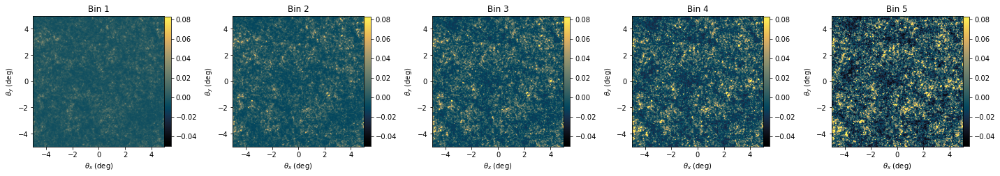

Sample 19


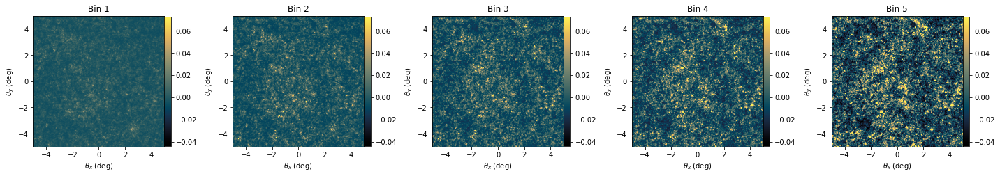

Sample 20


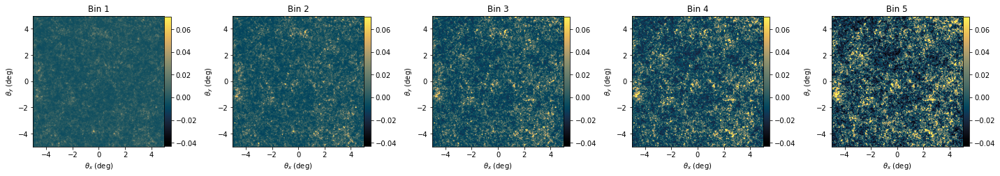

In [13]:
N_sample = 20

Cl_list = []
key=jax.random.PRNGKey(14)
for i in range(N_sample):
    print("===================================================")
    print("Sample %d"%(i+1))
    print("===================================================")
    
    
    key,subkey=jax.random.split(key)
    sample_map_fiducial = seed(model, subkey)
    m_data = sample_map_fiducial()
    Cl_list.append(m_data)
    
    fig, ax = plt.subplots(1,nbins, figsize=(4 * nbins, 7))

    EXTENT = (-0.5 * theta_max, 0.5 * theta_max, -0.5 * theta_max, 0.5 * theta_max)

    for i in range(nbins):
        std_kmap = np.std(m_data[-1])
        ax[i].set_title('Bin %d'%(i+1))
        ax[i].set_xlabel(r'$\theta_x$ (deg)')
        ax[i].set_ylabel(r'$\theta_y$ (deg)')
        ax[i].imshow(m_data[i],cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT)
        cb = fig.colorbar(ax[i].imshow(m_data[i],cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT) ,fraction=0.047, pad=0.)
        cb.ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

### Compare the results with the theory

In [14]:
from lenstools import ConvergenceMap
import astropy.units as u
import itertools
import cmasher as cmr

In [15]:
ell_theory = jnp.linspace(300, 5000, 128)   
cosmo = jc.Planck15(Omega_c=0.3, sigma8=0.8)
tracer = jc.probes.WeakLensing(nz_bins, sigma_e=0.26)
cell_theory = jc.angular_cl.angular_cl(cosmo, ell_theory, [tracer])

In [16]:
l_edges_kmap= np.linspace(300, 5000, 128)
lis=[0,1,2,3,4]
p_cross_sample=[]
for k in range(N_sample):
    m_data=Cl_list[k]
    p_cross=[]
    for i, j in itertools.combinations(lis, 2):
        pi=ConvergenceMap(m_data[i], angle=10*u.deg).cross(ConvergenceMap(m_data[j], angle=10*u.deg),l_edges=l_edges_kmap)[1]
        p_cross.append(pi)
    p_cross_sample.append(p_cross)
ell_sample=ConvergenceMap(m_data[0], angle=10*u.deg).cross(ConvergenceMap(m_data[0], angle=10*u.deg),l_edges=l_edges_kmap)[0]

In [17]:
p_auto_sample=[]
for k in range(N_sample):
    m_data=Cl_list[k]
    p_auto=[]
    for i in range(nbins):
        pi=ConvergenceMap(m_data[i], angle=10*u.deg).powerSpectrum(l_edges_kmap)[1]
        p_auto.append(pi)
    p_auto_sample.append(p_auto)

In [18]:
Cl_cross_arr = np.array(p_cross_sample)
Cl_mean_cross  = np.mean(Cl_cross_arr, axis=0)
Cl_lower_cross = np.percentile(Cl_cross_arr, 2.5, axis=0)
Cl_upper_cross = np.percentile(Cl_cross_arr, 97.5, axis=0)

In [19]:
Cl_auto_arr = np.array(p_auto_sample)
Cl_mean_auto  = np.mean(Cl_auto_arr, axis=0)
Cl_lower_auto = np.percentile(Cl_auto_arr, 2.5, axis=0)
Cl_upper_auto = np.percentile(Cl_auto_arr, 97.5, axis=0)

In [20]:
Cl_mean_sample_cross=fill_lower_diag(Cl_mean_cross,127)
Cl_lower_sample_cross=fill_lower_diag(Cl_lower_cross,127)
Cl_upper_sample_cross=fill_lower_diag(Cl_upper_cross,127)

In [21]:
Cl_mean_theory=fill_lower_and_diag(cell_theory,128)

In [22]:
col = cmr.eclipse([0.,0,0.55,0.85]) 

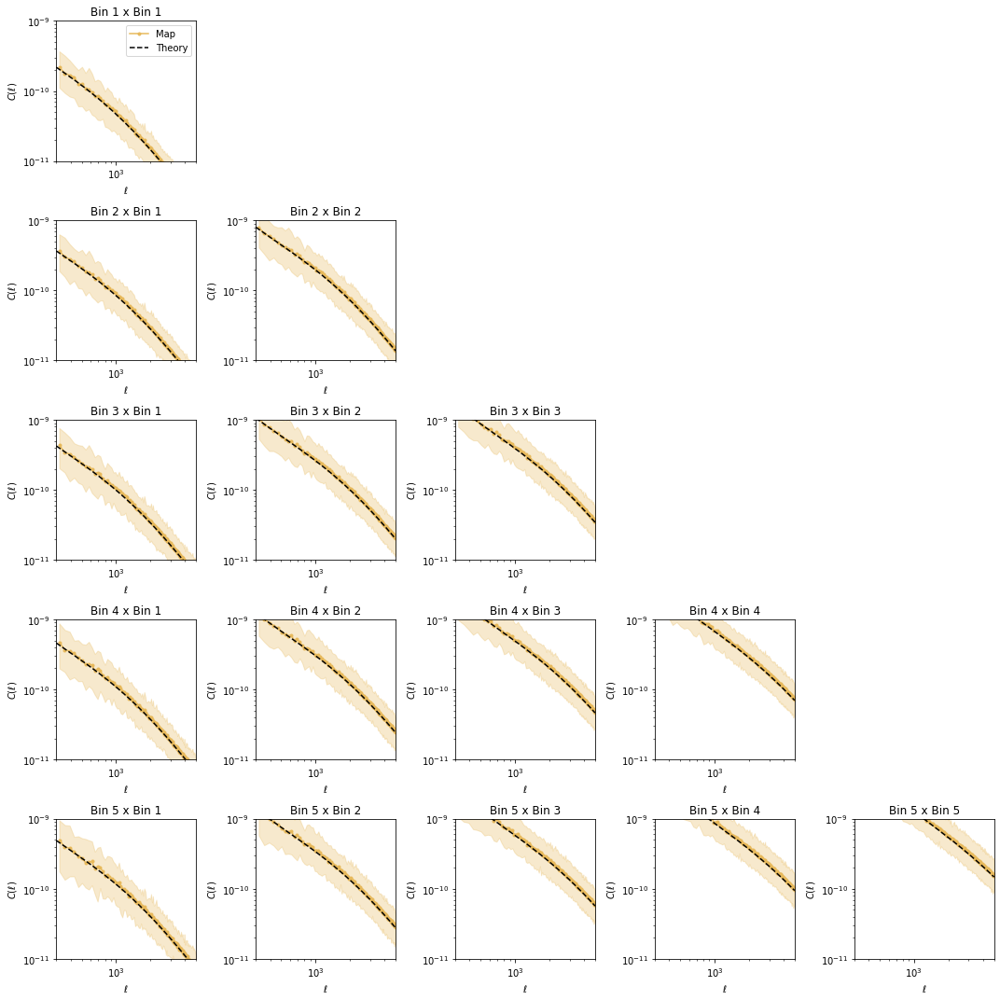

In [23]:
fig, ax = plt.subplots(nbins, nbins, figsize=(15,15))

for i in range(nbins):
    for j in range(nbins):
        if(j>i):
            ax[i,j].axis('off')
        else:
            ax[i,j].set_title('Bin %d x Bin %d'%(i+1,j+1))
            ax[i,j].set_xlabel('$\ell$')
            ax[i,j].set_ylabel('$C(\ell)$')
            ax[i,j].set_xlim(300., 5000.)
            ax[i,j].set_ylim(1e-11, 1e-9)
            if i==j:
                ax[i,j].loglog(ell_sample, Cl_mean_auto[i], '.-', color=col[3], label='Map')
                ax[i,j].loglog(ell_theory, Cl_mean_theory[:,i,j], '--',  color=col[1], label='Theory')
                ax[i,j].fill_between(ell_sample, Cl_lower_auto[i], Cl_upper_auto[i], color=col[3], alpha=0.3)
            else:
                ax[i,j].loglog(ell_sample, Cl_mean_sample_cross[:,i,j], '.-', color=col[3], label='Map')
                ax[i,j].loglog(ell_theory, Cl_mean_theory[:,i,j], '--',  color=col[1], label='Theory')
                ax[i,j].fill_between(ell_sample, Cl_lower_sample_cross[:, i,j], Cl_upper_sample_cross[:,i,j], color=col[3], alpha=0.3)

ax[0,0].legend()
plt.tight_layout()            
plt.show()   

In [26]:
jc.Planck15?

Signature:     
jc.Planck15(
    *,
    Omega_c=0.2589,
    Omega_b=0.0486,
    h=0.6774,
    n_s=0.9667,
    sigma8=0.8159,
    Omega_k=0.0,
    w0=-1.0,
    wa=0.0,
    gamma=None,
)
Call signature: jc.Planck15(*args, **kwargs)
Type:           partial
String form:    functools.partial(<class 'jax_cosmo.core.Cosmology'>, Omega_c=0.2589, Omega_b=0.0486, Omega_k=0.0, h=0.6774, n_s=0.9667, sigma8=0.8159, w0=-1.0, wa=0.0)
File:           /gpfslocalsup/pub/anaconda-py3/2021.05/envs/tensorflow-2.7.0+py3.9/lib/python3.9/functools.py
Docstring:     
partial(func, *args, **keywords) - new function with partial application
of the given arguments and keywords.


In [28]:
jc.Planck15(Omega_c=0.3, Omega_b=0.03, h=0.7, n_s=0.8, sigma8=0.8, w0=-1)

Cosmological parameters: 
    h:        0.7 
    Omega_b:  0.03 
    Omega_c:  0.3 
    Omega_k:  0.0 
    w0:       -1 
    wa:       0.0 
    n:        0.8 
    sigma8:   0.8